In [ ]:
!pip install yolov7detect

In [3]:
from PIL import Image
from transformers import YolosFeatureExtractor, YolosForObjectDetection
import torch
import matplotlib.pyplot as plt
from torchvision.transforms import ToTensor, ToPILImage
import yolov7
import os
PERSON_ID = 0

c:\Users\ILLIA\anaconda3\envs\dsw\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
%matplotlib inline

## Human Detector

In [ ]:
# load pretrained or custom model
human_detector = yolov7.load('kadirnar/yolov7-v0.1', hf_model=True)

# set model parameters
human_detector.conf = 0.8  # NMS confidence threshold
human_detector.iou = 0.45  # NMS IoU threshold
human_detector.classes = PERSON_ID  # filter by class

In [ ]:
human_detector.to('cuda')

In [ ]:
def human_detection(human_detector, img_path, img_pad=None):
    # perform inference
    results = human_detector(img_path)

    predictions = results.pred[0]
    boxes = predictions[:, :4] # x1, y1, x2, y2
    scores = predictions[:, 4]
    categories = predictions[:, 5]

    detections = []
    if img_pad is None:
        img_pad = 0
    for bbox in boxes:
        x_tl, y_tl, x_br, y_br = bbox
        x_tl = int(x_tl.item() - img_pad)
        y_tl = int(y_tl.item() - img_pad)
        x_br = int(x_br.item() + img_pad)
        y_br = int(y_br.item() + img_pad)
        #detections.append([x_tl, y_tl, x_br - x_tl, y_br - y_tl]) # xywh
        detections.append([x_tl, y_tl, x_br, y_br]) # xyxy
    return detections

## Object Detection Utils

In [ ]:
# This is the order of the categories list. NO NOT CHANGE. Just for visualization purposes
cats = ['shirt, blouse', 'top, t-shirt, sweatshirt', 'sweater', 'cardigan', 'jacket', 'vest', 'pants', 'shorts', 'skirt', 'coat', 'dress', 'jumpsuit', 'cape', 'glasses', 'hat', 'headband, head covering, hair accessory', 'tie', 'glove', 'watch', 'belt', 'leg warmer', 'tights, stockings', 'sock', 'shoe', 'bag, wallet', 'scarf', 'umbrella', 'hood', 'collar', 'lapel', 'epaulette', 'sleeve', 'pocket', 'neckline', 'buckle', 'zipper', 'applique', 'bead', 'bow', 'flower', 'fringe', 'ribbon', 'rivet', 'ruffle', 'sequin', 'tassel']

In [4]:
def fix_channels(t):
    """
    Some images may have 4 channels (transparent images) or just 1 channel (black and white images), in order to let the images have only 3 channels. I am going to remove the fourth channel in transparent images and stack the single channel in back and white images.
    :param t: Tensor-like image
    :return: Tensor-like image with three channels
    """
    if len(t.shape) == 2:
        return ToPILImage()(torch.stack([t for i in (0, 0, 0)]))
    if t.shape[0] == 4:
        return ToPILImage()(t[:3])
    if t.shape[0] == 1:
        return ToPILImage()(torch.stack([t[0] for i in (0, 0, 0)]))
    return ToPILImage()(t)

In [ ]:
def idx_to_text(i):
    return cats[i]

In [ ]:
# Random colors used for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes, image_path):
    fig = plt.figure(
        figsize=(16,10)
    )
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        ax.text(xmin, ymin, idx_to_text(cl), fontsize=10,
                bbox=dict(facecolor=c, alpha=0.8))
    plt.axis('off')
    #plt.show()
    plt.savefig(image_path)
    fig.canvas.draw()
    return Image.frombytes('RGB', fig.canvas.get_width_height(),fig.canvas.tostring_rgb())

In [ ]:
def visualize_predictions(image, outputs, image_path, threshold=0.8):
    # keep only predictions with confidence >= threshold
    probas = outputs.logits.softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > threshold

    # convert predicted boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), image.size)

    # plot results
    return plot_results(image, probas[keep], bboxes_scaled, image_path)

## 0. Example of human detection

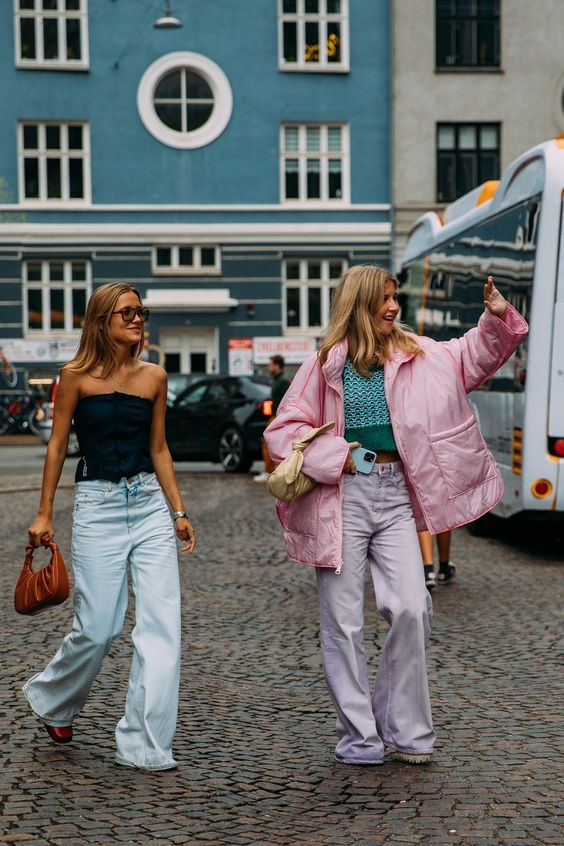

In [5]:
image = Image.open(open("fash4.jpg", "rb"))
image = fix_channels(ToTensor()(image))
image

In [ ]:
det = human_detection(human_detector, "fash4.jpg", img_pad=10)
det

[[9, 269, 206, 782], [254, 255, 539, 776]]

In [ ]:
imgs = [image.crop(d) for d in det]

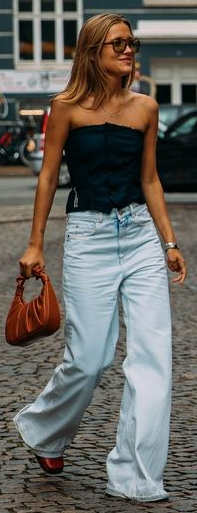

In [ ]:
imgs[0]

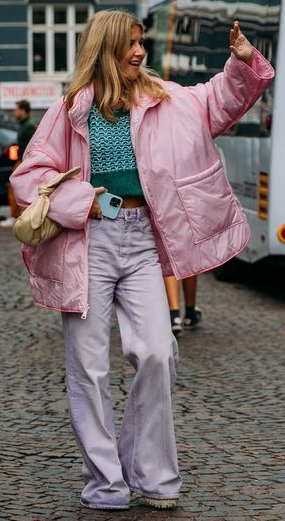

In [ ]:
imgs[1]

## YOLOS-Small (ft. Fashionpedia)

In [ ]:
MODEL_NAME = "valentinafeve/yolos-fashionpedia"
feature_extractor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-small')
model = YolosForObjectDetection.from_pretrained(MODEL_NAME)

In [ ]:
model.to("cuda")

# 1. Example A

## 1.1 YOLOS-Small (ft. Fashionpedia)

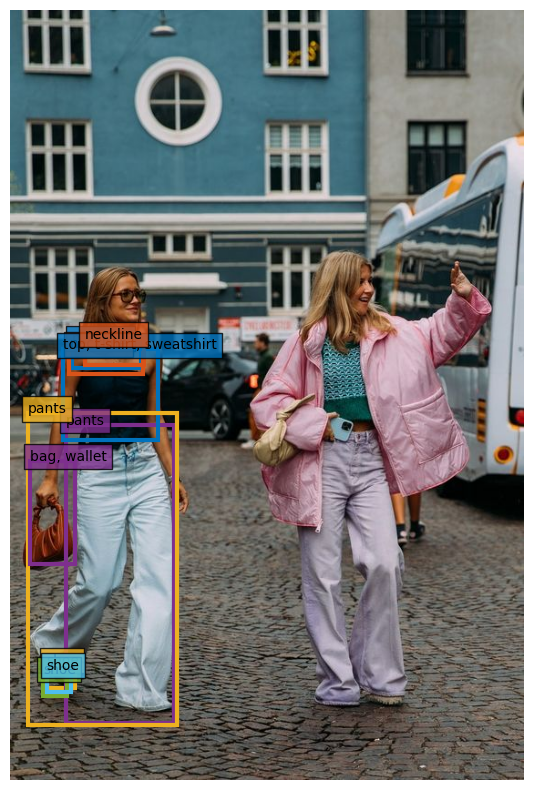

In [ ]:
inputs = feature_extractor(images=image, return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_full = visualize_predictions(image, outputs, threshold=0.5, image_path="fash4_full.png")
#res_full

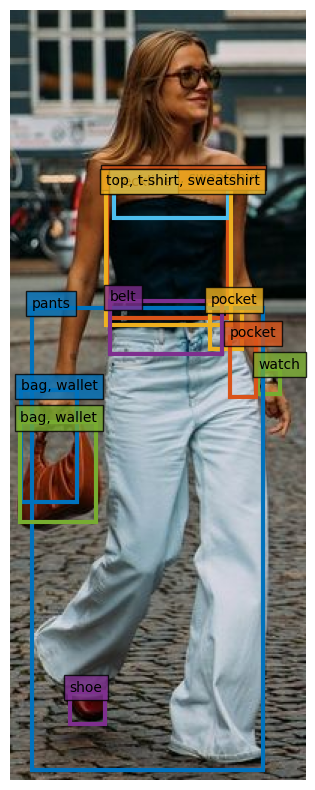

In [ ]:
inputs = feature_extractor(images=imgs[0], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_0 = visualize_predictions(imgs[0], outputs, threshold=0.5, image_path="fash4_per0.png")
#res_0

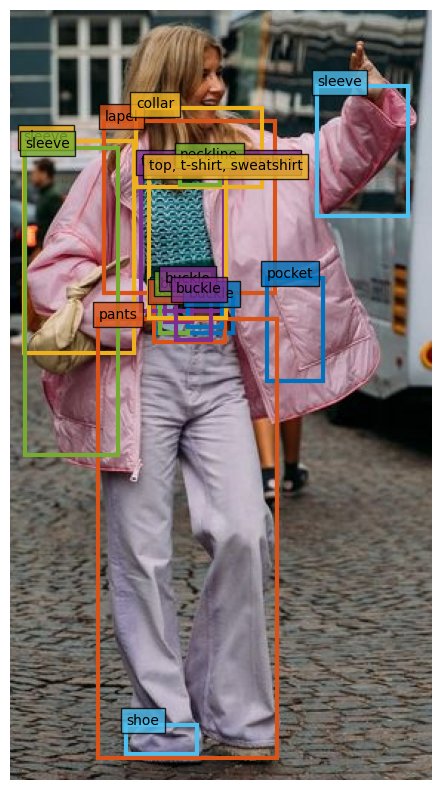

In [ ]:
inputs = feature_extractor(images=imgs[1], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_1 = visualize_predictions(imgs[1], outputs, threshold=0.5, image_path="fash4_per1.png")
#res_1

In [ ]:
imgs2 = [image.crop([d[0],0,d[2],image.size[1]]) for d in det]

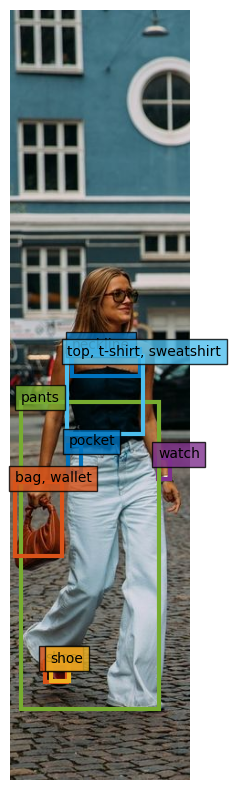

In [ ]:
inputs = feature_extractor(images=imgs2[0], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_0 = visualize_predictions(imgs2[0], outputs, threshold=0.5, image_path="fash4_per0_h.png")
#res_0

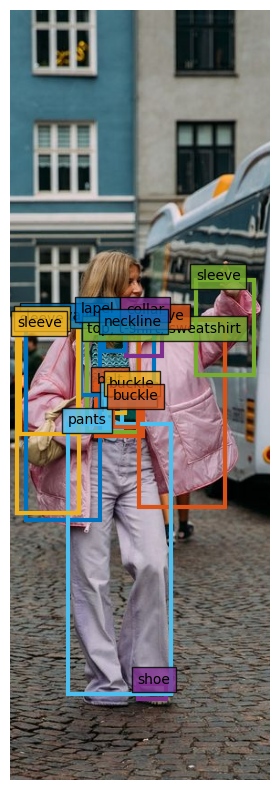

In [ ]:
inputs = feature_extractor(images=imgs2[1], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_1 = visualize_predictions(imgs2[1], outputs, threshold=0.5, image_path="fash4_per1_h.png")
#res_0

## 1.2. YOLOS-Tiny (ft. Spanish Dataset)

In [ ]:
clothes_detector = YolosForObjectDetection.from_pretrained('checkpoint-44000', local_files_only=True) # from checkpoint
clothes_processor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-tiny')

preprocessor_config.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/yolos/feature_extraction_yolos.py:38: FutureWarning: The class YolosFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use YolosImageProcessor instead.
  warnings.warn(


In [ ]:
clothes_detector.to("cuda")

In [ ]:
cats = ['shirt, blouse','top, t-shirt, sweatshirt','sweater','cardigan','jacket','vest','pants','shorts','skirt','coat','dress','jumpsuit','cape','glasses','hat','headband, head covering, hair accessory','tie','glove','watch','belt','leg warmer','tights, stockings','sock','shoe','bag, wallet','scarf','umbrella','hood','collar','lapel','epaulette','sleeve','pocket','neckline','buckle','zipper','applique','bead','bow','flower','fringe','ribbon','rivet','ruffle','sequin','tassel','earring','ring','bracelet','necklace','swimsuit','underwear','backpack']

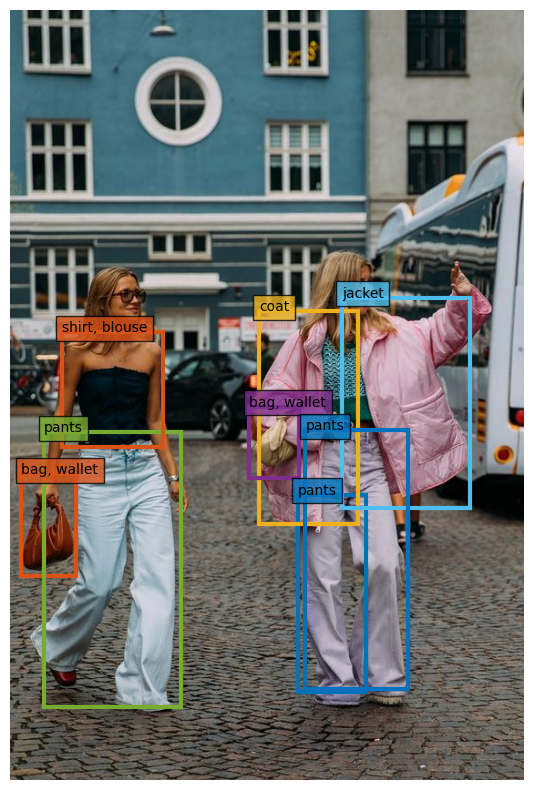

In [ ]:
inputs = clothes_processor(images=image, return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_full = visualize_predictions(image, outputs, threshold=0.5, image_path="fash4_full_ft.png")
#res_full

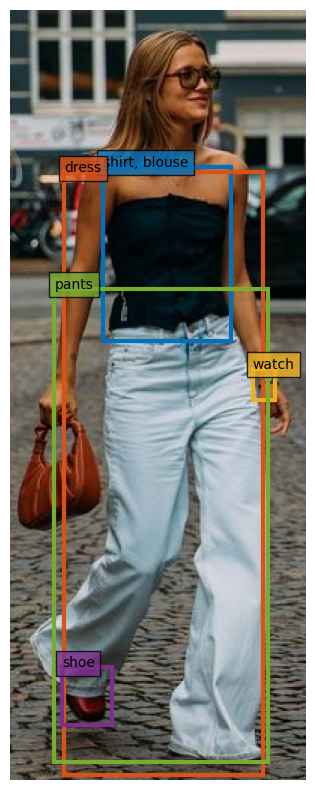

In [ ]:
inputs = clothes_processor(images=imgs[0], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_0 = visualize_predictions(imgs[0], outputs, threshold=0.5, image_path="fash4_per0_ft.png")
#res_0

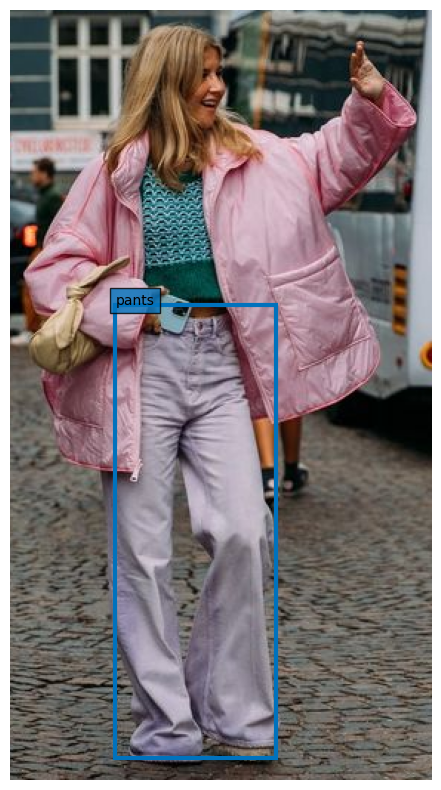

In [ ]:
inputs = clothes_processor(images=imgs[1], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_1 = visualize_predictions(imgs[1], outputs, threshold=0.5, image_path="fash4_per1_ft.png")
#res_0

In [ ]:
imgs2 = [image.crop([d[0],0,d[2],image.size[1]]) for d in det]

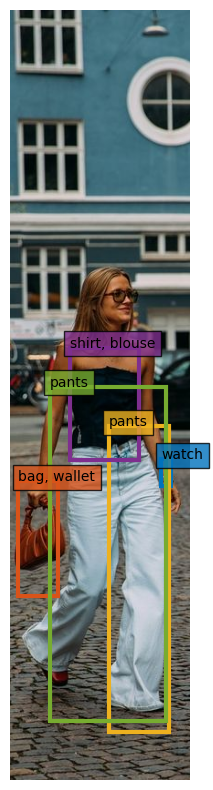

In [ ]:
inputs = clothes_processor(images=imgs2[0], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_0 = visualize_predictions(imgs2[0], outputs, threshold=0.5, image_path="fash4_per0_h_ft.png")
#res_0

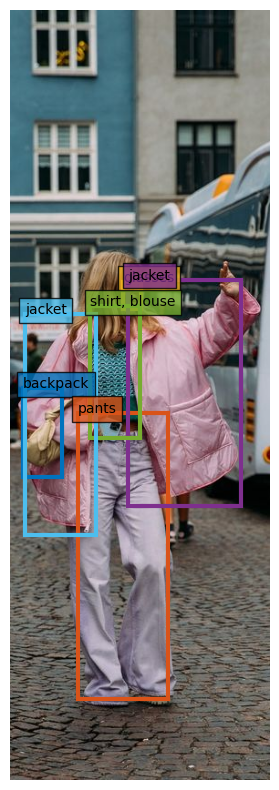

In [ ]:
inputs = clothes_processor(images=imgs2[1], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_1 = visualize_predictions(imgs2[1], outputs, threshold=0.5, image_path="fash4_per1_h_ft.png")
#res_0

# 2. Example B

In [ ]:
image = Image.open(open("fash3.jpg", "rb"))
image = fix_channels(ToTensor()(image))

In [ ]:
det = human_detection(human_detector, "fash3.jpg", 10)
det

[[545, 52, 691, 616], [379, 60, 575, 615], [240, 33, 411, 610]]

In [ ]:
imgs = [image.crop(d) for d in det]

## 2.1. YOLOS-Small (ft. Fashionpedia)

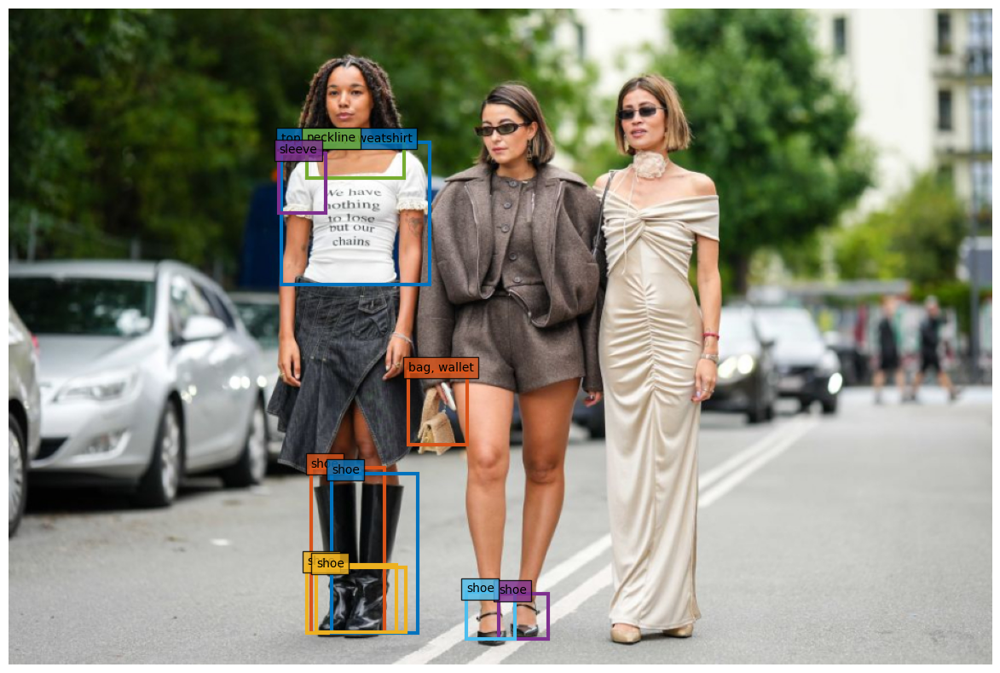

In [ ]:
inputs = feature_extractor(images=image, return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_full = visualize_predictions(image, outputs, threshold=0.5, image_path="fash3_full.png")
#res_full

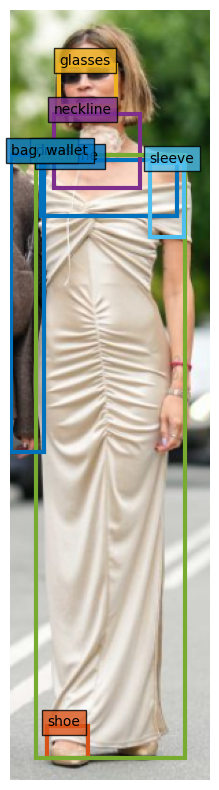

In [ ]:
inputs = feature_extractor(images=imgs[0], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_0 = visualize_predictions(imgs[0], outputs, threshold=0.5, image_path="fash3_per0.png")
#res_0

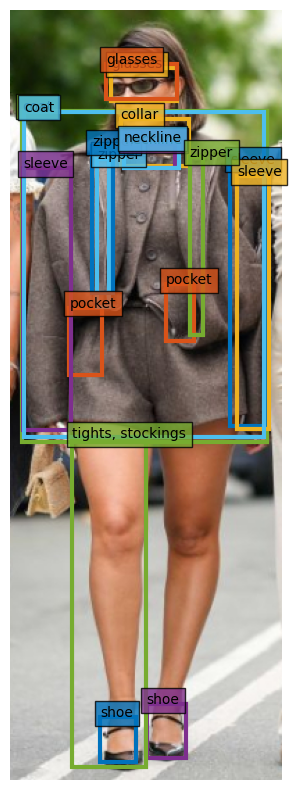

In [ ]:
inputs = feature_extractor(images=imgs[1], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_1 = visualize_predictions(imgs[1], outputs, threshold=0.5, image_path="fash3_per1.png")
#res_0

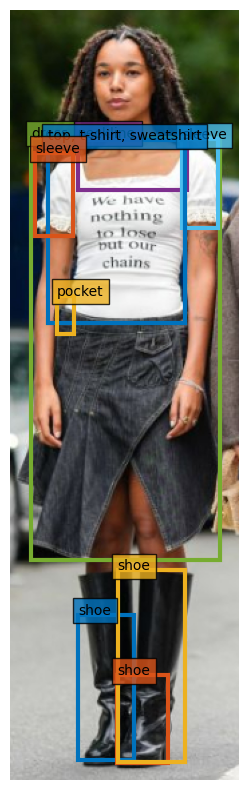

In [ ]:
inputs = feature_extractor(images=imgs[2], return_tensors="pt").to("cuda")
outputs = model(**inputs)
res_2 = visualize_predictions(imgs[2], outputs, threshold=0.5, image_path="fash3_per2.png")
#res_0

## 2.2. YOLOS-Tiny (ft. Spanish Dataset)

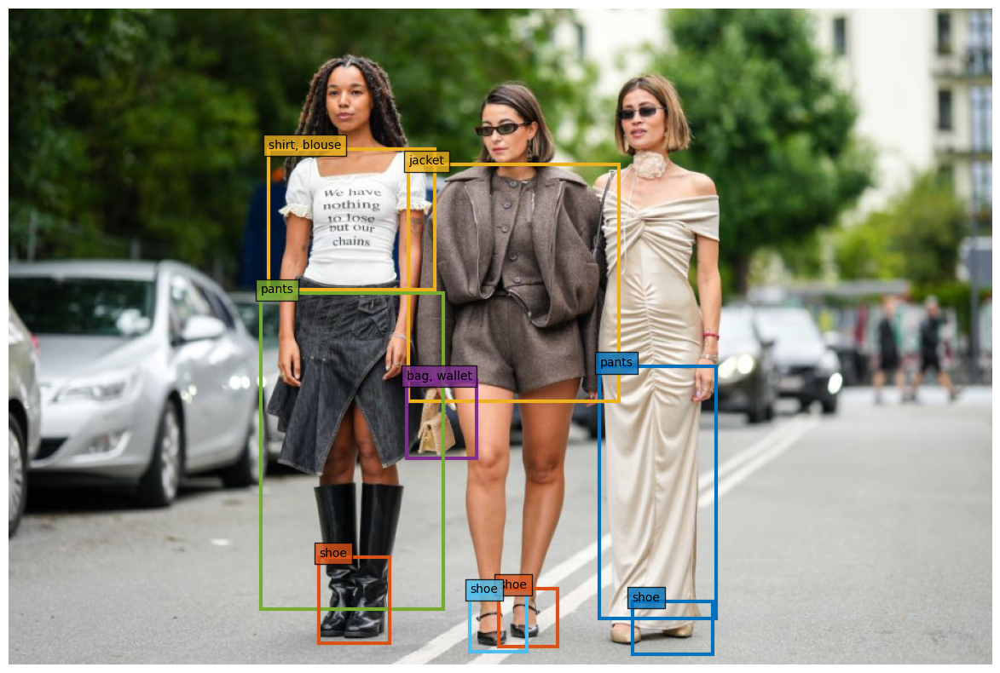

In [ ]:
inputs = clothes_processor(images=image, return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_full = visualize_predictions(image, outputs, threshold=0.5, image_path="fash3_full_ft.png")
#res_full

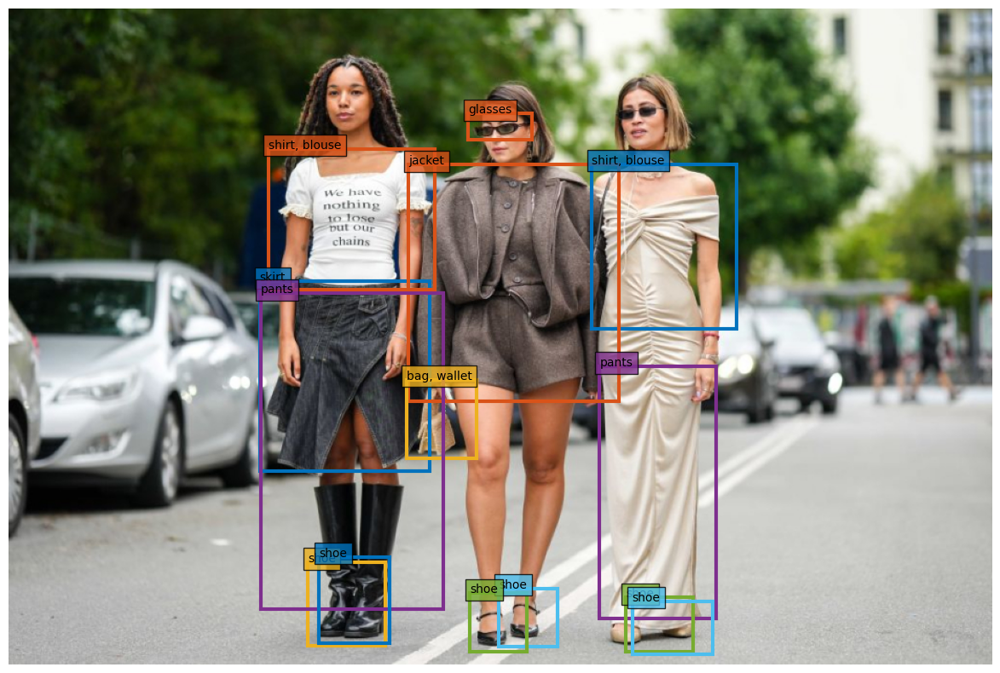

In [ ]:
res_full = visualize_predictions(image, outputs, threshold=0.3, image_path="fash3_full_ft_03.png")
#res_full

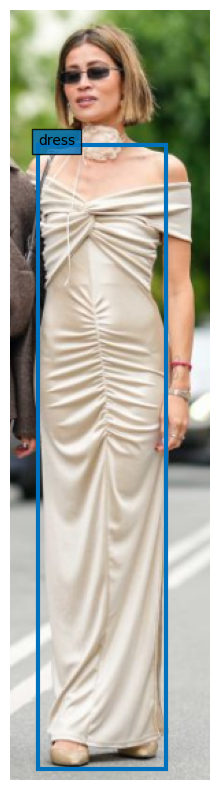

In [ ]:
inputs = clothes_processor(images=imgs[0], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_0 = visualize_predictions(imgs[0], outputs, threshold=0.5, image_path="fash3_per0_ft.png")
#res_0

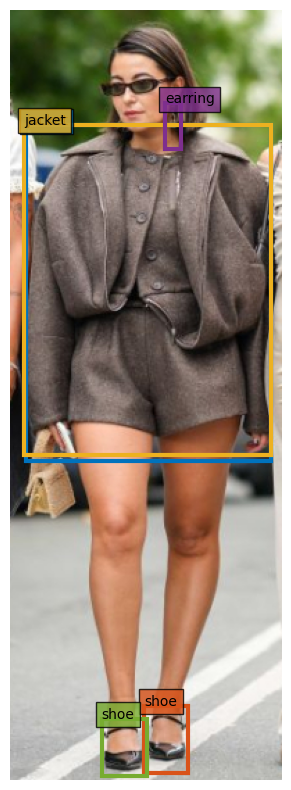

In [ ]:
inputs = clothes_processor(images=imgs[1], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_1 = visualize_predictions(imgs[1], outputs, threshold=0.5, image_path="fash3_per1_ft.png")
#res_0

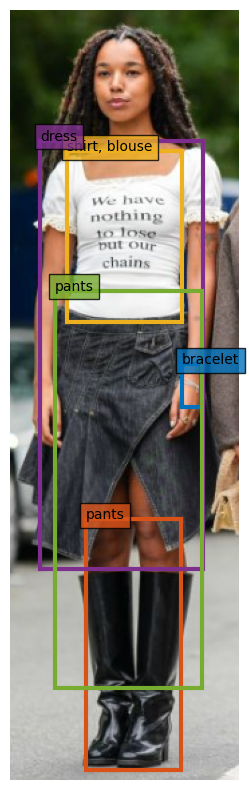

In [ ]:
inputs = clothes_processor(images=imgs[2], return_tensors="pt").to("cuda")
outputs = clothes_detector(**inputs)
res_2 = visualize_predictions(imgs[2], outputs, threshold=0.5, image_path="fash3_per2_ft.png")
#res_0

## Human detection + Clothing detection

In [ ]:
def process_predictions(probas, bboxes, x_tl, y_tl):
  detections = []
  for p, bbox in zip(probas, bboxes):
    cat_id = p.detach().cpu().numpy().argmax()
    x1, y1, x2, y2= bbox.detach().cpu().numpy()
    x1 += x_tl
    x2 += x_tl
    y1 += y_tl
    y2 += y_tl
    detections.append([cat_id,x1,y1,x2,y2])
  return detections

def predict(human_detector, clothes_detector, processor, img_path, img_pad, device="cuda:0"):
  # perform human detection 
  results = human_detector(img_path)

  predictions = results.pred[0]
  boxes = predictions[:, :4] # x1, y1, x2, y2
  scores = predictions[:, 4]
  categories = predictions[:, 5]

  img = Image.open(open(img_path, "rb"))
  img = fix_channels(ToTensor()(img))

  # sometimes pieces of garderob (ex. bag) can be outside the human bbox
  # in this case we may pad the human bbox for it to be used in clothing detection
  if type(img_pad) == int:
    img_pad = (img_pad, img_pad, img_pad, img_pad)
  elif len(img_pad) == 2:
    hor, ver = img_pad
    img_pad = (hor, ver, hor, ver)

  results = []
  # for each human in the image
  for i, bbox in enumerate(boxes):
    record = dict() 
    record["person_id"] = i
    # retrieve top-left and bottom-right coordinates
    x_tl, y_tl = bbox[0].item(), bbox[1].item()
    x_br, y_br = bbox[2].item(), bbox[3].item()
    record["bbox"] = [x_tl, y_tl ,x_br ,y_br]
    
    # perform padding to include pieces of clothing that may be outside the initial bbox
    x_tl = max(0,int(x_tl - img_pad[0]))
    y_tl = max(0,int(y_tl - img_pad[1]))
    x_br = min(int(x_br + img_pad[2]), img.size[0])
    y_br = min(int(y_br + img_pad[3]), img.size[1])
    # get the final human crop
    human_crop = [x_tl, y_tl, x_br, y_br]
    
    img_crop = img.crop(human_crop)
    # run clothing detection for a single person
    inputs = processor(images=img_crop, return_tensors="pt").to(device)
    outputs = clothes_detector(**inputs)

    probas = outputs.logits.softmax(-1)[0, :, :-1]
    # keep predicitions with confidence above the threshold 
    keep = probas.max(-1).values > 0.8

    # rescale clothing bboxes from [0..1]x[0..1] to [0..img_crop.w]x[0..img_crop.h]  
    bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), img_crop.size)
    probas = probas[keep]

    # shift clothing bboxes from [0..img_crop.w]x[0..img_crop.h] to [0..img.w]x[0..img.h] 
    detections = process_predictions(probas, bboxes_scaled, x_tl, y_tl)
    record["clothes"] = []
    for det in detections:
      cat_id = int(det[0])
      bbox = [float(v) for v in det[1:]]
      record["clothes"].append({"category_id": cat_id, "bbox": bbox})

    results.append(record)
  results = {"detections": results}
  return results, img
    
    
def plot_results(pil_img, results, image_path):
    fig = plt.figure(
        figsize=(16,10)
    )
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    color_id = 0
    for person_record in results['detections']:
      det = person_record['clothes']
      for clothes_rec in det:
        xmin, ymin, xmax, ymax = clothes_rec['bbox']
        cl = clothes_rec['category_id']

        ax.add_patch(
            plt.Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                fill=False, color=colors[color_id], linewidth=3
            )
        )
        ax.text(
            xmin, ymin, idx_to_text(cl), fontsize=10,
            bbox=dict(facecolor=colors[color_id], alpha=0.8)
        )
        color_id += 1
    plt.axis('off')
    #plt.show()
    plt.savefig(image_path)
    fig.canvas.draw()
    return Image.frombytes('RGB', fig.canvas.get_width_height(),fig.canvas.tostring_rgb())

In [ ]:
res, img = predict(human_detector, model, feature_extractor, "fash4.jpg", 10, device="cuda:0")
plot_results(img, res, "fash4_out.png")